# Computer practicum №1 (Python)

Work with graph structures


In [0]:
from functools import reduce
from pyspark.sql import functions as F
from graphframes import GraphFrame

## Data preparation



Download data:

In [0]:

#dbutils.fs.rm("dbfs:/FileStore/tables/Online_Retail.csv", True)

display(dbutils.fs.ls("/FileStore/tables/"))

path,name,size,modificationTime
dbfs:/FileStore/tables/Online_Retail.csv,Online_Retail.csv,46079956,1730631531000
dbfs:/FileStore/tables/airlines.dat,airlines.dat,396908,1729377227000
dbfs:/FileStore/tables/airports_extended.dat,airports_extended.dat,1467665,1729425477000
dbfs:/FileStore/tables/routes.dat,routes.dat,2377270,1729377417000


In [0]:

retail_location = "dbfs:/FileStore/tables/Online_Retail.csv"

retails_df = spark.read.format("csv") \
    .option("inferSchema", "true") \
    .option("header", "true") \
    .option("sep", ";") \
    .load(retail_location)

retails_df.show(5)
print(retails_df.count())


+---------+---------+--------------------+--------+---------------+---------+----------+--------------+
|InvoiceNo|StockCode|         Description|Quantity|    InvoiceDate|UnitPrice|CustomerID|       Country|
+---------+---------+--------------------+--------+---------------+---------+----------+--------------+
|   536365|   85123A|WHITE HANGING HEA...|       6|01.12.2010 8:26|     2,55|     17850|United Kingdom|
|   536365|    71053| WHITE METAL LANTERN|       6|01.12.2010 8:26|     3,39|     17850|United Kingdom|
|   536365|   84406B|CREAM CUPID HEART...|       8|01.12.2010 8:26|     2,75|     17850|United Kingdom|
|   536365|   84029G|KNITTED UNION FLA...|       6|01.12.2010 8:26|     3,39|     17850|United Kingdom|
|   536365|   84029E|RED WOOLLY HOTTIE...|       6|01.12.2010 8:26|     3,39|     17850|United Kingdom|
+---------+---------+--------------------+--------+---------------+---------+----------+--------------+
only showing top 5 rows

541909


Clean and transformation dataframe

In [0]:
from pyspark.sql.functions import col, when, regexp_replace

    #remove rows with null value in column CustomerID 
retails_df = retails_df.filter("CustomerID is not null")
print(retails_df.count())

    #transform "InvoiceNo" to 1 (Success) and 0 (Cancel)
retails_df = retails_df.withColumn("InvoiceNo", when(col("InvoiceNo").startswith("C"), 0).otherwise(1)) \
                       .withColumnRenamed("InvoiceNo", "StatusInvoice")

    # remove rows with '0' value in column UnitPrice
retails_df = retails_df.filter("UnitPrice != '0'")
print(retails_df.count())

    # cast tupe UnitPrice tp float 
retails_df = retails_df.withColumn("UnitPrice", regexp_replace("UnitPrice", ",", ".").cast("float"))

    # delete column Description
retails_df = retails_df.drop("Description")

    # Classification goal
retails_df = retails_df.withColumn("Quantity", when(col("Quantity") < 10, "Less 10").otherwise("10 and more"))

display(retails_df.limit(5))


406829
406789


StatusInvoice,StockCode,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
1,85123A,Less 10,01.12.2010 8:26,2.55,17850,United Kingdom
1,71053,Less 10,01.12.2010 8:26,3.39,17850,United Kingdom
1,84406B,Less 10,01.12.2010 8:26,2.75,17850,United Kingdom
1,84029G,Less 10,01.12.2010 8:26,3.39,17850,United Kingdom
1,84029E,Less 10,01.12.2010 8:26,3.39,17850,United Kingdom


Transform columns 'Country' and 'StatusInvoice' into a vector representation using OneHotEncoder

In [0]:
from pyspark.ml.feature import StringIndexer, OneHotEncoder
from pyspark.ml import Pipeline

country_indexer = StringIndexer(inputCol="Country", outputCol="CountryIndex")
country_encoder = OneHotEncoder(inputCol="CountryIndex", outputCol="CountryEncoded")
pipeline = Pipeline(stages=[country_indexer, country_encoder])
retails_df = pipeline.fit(retails_df).transform(retails_df)

status_invoice_indexer = StringIndexer(inputCol="StatusInvoice", outputCol="StatusInvoiceIndex")
status_invoice_encoder = OneHotEncoder(inputCol="StatusInvoiceIndex", outputCol="StatusInvoiceEncoded")
pipeline = Pipeline(stages=[status_invoice_indexer, status_invoice_encoder])
retails_df = pipeline.fit(retails_df).transform(retails_df)

display(retails_df.limit(5))

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

StatusInvoice,StockCode,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,CountryIndex,CountryEncoded,StatusInvoiceIndex,StatusInvoiceEncoded
1,85123A,Less 10,01.12.2010 8:26,2.55,17850,United Kingdom,0.0,"Map(vectorType -> sparse, length -> 36, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))"
1,71053,Less 10,01.12.2010 8:26,3.39,17850,United Kingdom,0.0,"Map(vectorType -> sparse, length -> 36, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))"
1,84406B,Less 10,01.12.2010 8:26,2.75,17850,United Kingdom,0.0,"Map(vectorType -> sparse, length -> 36, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))"
1,84029G,Less 10,01.12.2010 8:26,3.39,17850,United Kingdom,0.0,"Map(vectorType -> sparse, length -> 36, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))"
1,84029E,Less 10,01.12.2010 8:26,3.39,17850,United Kingdom,0.0,"Map(vectorType -> sparse, length -> 36, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))"


Transform columns 'StockCode' and 'CustomerID' using HashingTF


In [0]:
from pyspark.ml.feature import HashingTF, Tokenizer

tokenizer = Tokenizer(inputCol="StockCode", outputCol="StockCodeTokens")
retails_df = tokenizer.transform(retails_df)
hashing_tf = HashingTF(inputCol="StockCodeTokens", outputCol="StockCodeHashed", numFeatures=100)
retails_df = hashing_tf.transform(retails_df)

retails_df = retails_df.withColumn("CustomerIDStr", retails_df["CustomerID"].cast("string"))
tokenizer = Tokenizer(inputCol="CustomerIDStr", outputCol="CustomerIDTokens")
retails_df = tokenizer.transform(retails_df)
hashing_tf = HashingTF(inputCol="CustomerIDTokens", outputCol="CustomerIDHashed", numFeatures=100)
retails_df = hashing_tf.transform(retails_df)

display(retails_df.limit(5))

StatusInvoice,StockCode,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,CountryIndex,CountryEncoded,StatusInvoiceIndex,StatusInvoiceEncoded,StockCodeTokens,StockCodeHashed,CustomerIDStr,CustomerIDTokens,CustomerIDHashed
1,85123A,Less 10,01.12.2010 8:26,2.55,17850,United Kingdom,0.0,"Map(vectorType -> sparse, length -> 36, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",List(85123a),"Map(vectorType -> sparse, length -> 100, indices -> List(23), values -> List(1.0))",17850,List(17850),"Map(vectorType -> sparse, length -> 100, indices -> List(95), values -> List(1.0))"
1,71053,Less 10,01.12.2010 8:26,3.39,17850,United Kingdom,0.0,"Map(vectorType -> sparse, length -> 36, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",List(71053),"Map(vectorType -> sparse, length -> 100, indices -> List(4), values -> List(1.0))",17850,List(17850),"Map(vectorType -> sparse, length -> 100, indices -> List(95), values -> List(1.0))"
1,84406B,Less 10,01.12.2010 8:26,2.75,17850,United Kingdom,0.0,"Map(vectorType -> sparse, length -> 36, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",List(84406b),"Map(vectorType -> sparse, length -> 100, indices -> List(94), values -> List(1.0))",17850,List(17850),"Map(vectorType -> sparse, length -> 100, indices -> List(95), values -> List(1.0))"
1,84029G,Less 10,01.12.2010 8:26,3.39,17850,United Kingdom,0.0,"Map(vectorType -> sparse, length -> 36, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",List(84029g),"Map(vectorType -> sparse, length -> 100, indices -> List(85), values -> List(1.0))",17850,List(17850),"Map(vectorType -> sparse, length -> 100, indices -> List(95), values -> List(1.0))"
1,84029E,Less 10,01.12.2010 8:26,3.39,17850,United Kingdom,0.0,"Map(vectorType -> sparse, length -> 36, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",List(84029e),"Map(vectorType -> sparse, length -> 100, indices -> List(92), values -> List(1.0))",17850,List(17850),"Map(vectorType -> sparse, length -> 100, indices -> List(95), values -> List(1.0))"


get hour with column InvoiceDate, (InvoiceHour)


In [0]:
from pyspark.sql.functions import hour, to_timestamp

retails_df = retails_df.withColumn("InvoiceTimestamp", to_timestamp("InvoiceDate", "dd.MM.yyyy H:mm"))
retails_df = retails_df.withColumn("InvoiceHour", hour("InvoiceTimestamp"))

display(retails_df.limit(5))


StatusInvoice,StockCode,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,CountryIndex,CountryEncoded,StatusInvoiceIndex,StatusInvoiceEncoded,StockCodeTokens,StockCodeHashed,CustomerIDStr,CustomerIDTokens,CustomerIDHashed,InvoiceTimestamp,InvoiceHour
1,85123A,Less 10,01.12.2010 8:26,2.55,17850,United Kingdom,0.0,"Map(vectorType -> sparse, length -> 36, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",List(85123a),"Map(vectorType -> sparse, length -> 100, indices -> List(23), values -> List(1.0))",17850,List(17850),"Map(vectorType -> sparse, length -> 100, indices -> List(95), values -> List(1.0))",2010-12-01T08:26:00Z,8
1,71053,Less 10,01.12.2010 8:26,3.39,17850,United Kingdom,0.0,"Map(vectorType -> sparse, length -> 36, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",List(71053),"Map(vectorType -> sparse, length -> 100, indices -> List(4), values -> List(1.0))",17850,List(17850),"Map(vectorType -> sparse, length -> 100, indices -> List(95), values -> List(1.0))",2010-12-01T08:26:00Z,8
1,84406B,Less 10,01.12.2010 8:26,2.75,17850,United Kingdom,0.0,"Map(vectorType -> sparse, length -> 36, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",List(84406b),"Map(vectorType -> sparse, length -> 100, indices -> List(94), values -> List(1.0))",17850,List(17850),"Map(vectorType -> sparse, length -> 100, indices -> List(95), values -> List(1.0))",2010-12-01T08:26:00Z,8
1,84029G,Less 10,01.12.2010 8:26,3.39,17850,United Kingdom,0.0,"Map(vectorType -> sparse, length -> 36, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",List(84029g),"Map(vectorType -> sparse, length -> 100, indices -> List(85), values -> List(1.0))",17850,List(17850),"Map(vectorType -> sparse, length -> 100, indices -> List(95), values -> List(1.0))",2010-12-01T08:26:00Z,8
1,84029E,Less 10,01.12.2010 8:26,3.39,17850,United Kingdom,0.0,"Map(vectorType -> sparse, length -> 36, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))",List(84029e),"Map(vectorType -> sparse, length -> 100, indices -> List(92), values -> List(1.0))",17850,List(17850),"Map(vectorType -> sparse, length -> 100, indices -> List(95), values -> List(1.0))",2010-12-01T08:26:00Z,8


delete not needed columns

In [0]:
retails_df = retails_df.drop("Country", "CountryIndex",
                             "StatusInvoice", "StatusInvoiceIndex", 
                             "StockCode", "StockCodeTokens",
                             "CustomerID", "CustomerIDStr", "CustomerIDTokens", 
                             "InvoiceDate", "InvoiceTimestamp")

retails_df = retails_df.withColumnRenamed("CountryEncoded", "Country")
retails_df = retails_df.withColumnRenamed("StatusInvoiceEncoded", "StatusInvoice")
retails_df = retails_df.withColumnRenamed("StockCodeHashed", "StockCode")
retails_df = retails_df.withColumnRenamed("CustomerIDHashed", "CustomerID")

display(retails_df.limit(5))

Quantity,UnitPrice,Country,StatusInvoice,StockCode,CustomerID,InvoiceHour
Less 10,2.55,"Map(vectorType -> sparse, length -> 36, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 100, indices -> List(23), values -> List(1.0))","Map(vectorType -> sparse, length -> 100, indices -> List(95), values -> List(1.0))",8
Less 10,3.39,"Map(vectorType -> sparse, length -> 36, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 100, indices -> List(4), values -> List(1.0))","Map(vectorType -> sparse, length -> 100, indices -> List(95), values -> List(1.0))",8
Less 10,2.75,"Map(vectorType -> sparse, length -> 36, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 100, indices -> List(94), values -> List(1.0))","Map(vectorType -> sparse, length -> 100, indices -> List(95), values -> List(1.0))",8
Less 10,3.39,"Map(vectorType -> sparse, length -> 36, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 100, indices -> List(85), values -> List(1.0))","Map(vectorType -> sparse, length -> 100, indices -> List(95), values -> List(1.0))",8
Less 10,3.39,"Map(vectorType -> sparse, length -> 36, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 100, indices -> List(92), values -> List(1.0))","Map(vectorType -> sparse, length -> 100, indices -> List(95), values -> List(1.0))",8


create dataset with features and label 

In [0]:
from pyspark.ml.feature import VectorAssembler

label_indexer =StringIndexer(inputCol="Quantity", outputCol="label")
retails_df = label_indexer.fit(retails_df).transform(retails_df)

feature_columns = ["UnitPrice", "Country", "StatusInvoice", "StockCode", "CustomerID", "InvoiceHour"]

assembler = VectorAssembler(inputCols=feature_columns, outputCol="features")
retails_df = assembler.transform(retails_df)

selected_columns = ["features", "label"]
dataset = retails_df.select(selected_columns)

display(dataset.limit(5))

features,label
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 61, 233, 238), values -> List(2.549999952316284, 1.0, 1.0, 1.0, 1.0, 8.0))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 42, 233, 238), values -> List(3.390000104904175, 1.0, 1.0, 1.0, 1.0, 8.0))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 132, 233, 238), values -> List(2.75, 1.0, 1.0, 1.0, 1.0, 8.0))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 123, 233, 238), values -> List(3.390000104904175, 1.0, 1.0, 1.0, 1.0, 8.0))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 130, 233, 238), values -> List(3.390000104904175, 1.0, 1.0, 1.0, 1.0, 8.0))",0.0


split dataset to training and test data

In [0]:
(training_dataset, test_dataset) = dataset.randomSplit([0.7, 0.3], seed=20)
print(f"Count training: {training_dataset.count()}")
print(f"Count test: {test_dataset.count()}")

Count training: 284812
Count test: 121977


## Additional functions


function: calculate f-score and accuracy


In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

def calculate_metrics(predictions):
    evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction")
    
    f1_score = evaluator.evaluate(predictions, {evaluator.metricName: "f1"})
    accuracy = evaluator.evaluate(predictions, {evaluator.metricName: "accuracy"})

    print(f"f1_score: {f1_score}")
    print(f"accuracy: {accuracy}")

ROC-curve

In [0]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import pandas as pd

def show_ROC_curve_and_calculate_area(predictions):
  evaluator = BinaryClassificationEvaluator()
  auc_roc = evaluator.evaluate(predictions)

  probabilities_labels = predictions.select("rawPrediction", "label").rdd.map(lambda row: (float(row["rawPrediction"][1]), float(row["label"])))

  roc_data = pd.DataFrame(probabilities_labels.collect(), columns=["probability", "label"])

  fpr, tpr, _ = roc_curve(roc_data["label"], roc_data["probability"])
  roc_auc = auc(fpr, tpr)

  plt.figure(figsize=(8, 8))
  plt.plot(fpr, tpr, color="blue", lw=2, label="ROC curve, area={:.3f}".format(roc_auc))
  plt.plot([0, 1], [0, 1], color="red", lw=2, linestyle="--")
  plt.title("ROC Curve")
  plt.xlabel("False positive rate")
  plt.ylabel("True positive rate")
  plt.legend(loc="lower right")
  plt.show

  print(f"\narea under ROC: {roc_auc}")

function: show confusion matrix 

In [0]:

from pyspark.mllib.evaluation import MulticlassMetrics
import seaborn as sns
import matplotlib.pyplot as plt

def show_confusion_matrix(predictions):
    predictionAndLabel = predictions.select("prediction", "label").rdd.map(lambda row: (float(row["prediction"]), float(row["label"])))

    multiclass_metrics = MulticlassMetrics(predictionAndLabel)

    conf_matrix = multiclass_metrics.confusionMatrix().toArray()
    
    sns.heatmap(conf_matrix, annot=True, fmt='g', cmap='Blues', 
                xticklabels=['Predicted [ < 10 ]', 'Predicted [ >= 10 ]'], 
                yticklabels=['Actual [ < 10 ]', 'Actual [ >= 10 ]'])
    plt.xlabel('Predicted Label')
    plt.ylabel('Actual Label')
    plt.title('Confusion Matrix')
    plt.show()


function show clustering

In [0]:
import matplotlib.pyplot as plt
import pandas as pd

def show_clustering_result(predictions, text):
    predictions_pd = predictions.select("pcaFeatures", "prediction").toPandas()

    predictions_pd['x'] = predictions_pd['pcaFeatures'].apply(lambda x: x[0])
    predictions_pd['y'] = predictions_pd['pcaFeatures'].apply(lambda x: x[1])


    plt.figure(figsize=(10, 6))
    scatter = plt.scatter(predictions_pd['x'], predictions_pd['y'], c=predictions_pd['prediction'], cmap='viridis')
    plt.legend(*scatter.legend_elements(), title="Clusters")
    plt.title(text)
    plt.xlabel("PCA Component 1")
    plt.ylabel("PCA Component 2")
    plt.grid(True)
    plt.show()

## Сlassification Logistic Regression
well suited for medium and large datasets

Create and training model

In [0]:
from pyspark.ml.classification import LogisticRegression

logistic_regresion = LogisticRegression(labelCol="label", featuresCol="features", regParam=0.5)
logistic_regresion_model = logistic_regresion.fit(training_dataset)

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

result for created model

In [0]:
predictions = logistic_regresion_model.transform(test_dataset)
display(predictions)

features,label,rawPrediction,probability,prediction
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 38, 138, 238), values -> List(7.949999809265137, 1.0, 1.0, 1.0, 1.0, 12.0))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.44546033507050903, -0.44546033507050903))","Map(vectorType -> dense, length -> 2, values -> List(0.6095593474025454, 0.39044065259745464))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 38, 140, 238), values -> List(2.0999999046325684, 1.0, 1.0, 1.0, 1.0, 15.0))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.6658200669066111, -0.6658200669066111))","Map(vectorType -> dense, length -> 2, values -> List(0.6605665713539222, 0.33943342864607784))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 38, 141, 238), values -> List(1.25, 1.0, 1.0, 1.0, 1.0, 17.0))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.5986764538736157, -0.5986764538736157))","Map(vectorType -> dense, length -> 2, values -> List(0.6453534413876302, 0.3546465586123698))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 38, 141, 238), values -> List(1.649999976158142, 1.0, 1.0, 1.0, 1.0, 11.0))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.38605027754509036, -0.38605027754509036))","Map(vectorType -> dense, length -> 2, values -> List(0.5953315235389255, 0.4046684764610745))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 38, 143, 238), values -> List(0.8500000238418579, 1.0, 1.0, 1.0, 1.0, 10.0))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.4527930533226232, -0.4527930533226232))","Map(vectorType -> dense, length -> 2, values -> List(0.6113031018213081, 0.3886968981786919))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 38, 143, 238), values -> List(1.649999976158142, 1.0, 1.0, 1.0, 1.0, 15.0))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.6301877334496168, -0.6301877334496168))","Map(vectorType -> dense, length -> 2, values -> List(0.6525320289637715, 0.3474679710362285))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 38, 145, 238), values -> List(2.950000047683716, 1.0, 1.0, 1.0, 1.0, 15.0))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.5965249750282877, -0.5965249750282877))","Map(vectorType -> dense, length -> 2, values -> List(0.6448608734618392, 0.3551391265381608))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 38, 147, 238), values -> List(4.949999809265137, 1.0, 1.0, 1.0, 1.0, 12.0))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.47849965924324533, -0.47849965924324533))","Map(vectorType -> dense, length -> 2, values -> List(0.617393528614515, 0.382606471385485))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 38, 147, 238), values -> List(7.949999809265137, 1.0, 1.0, 1.0, 1.0, 14.0))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(0.5499451333324319, -0.5499451333324319))","Map(vectorType -> dense, length -> 2, values -> List(0.6341228614308856, 0.3658771385691144))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 38, 148, 238), values -> List(1.649999976158142, 1.0, 1.0, 1.0, 1.0, 18.0))",1.0,"Map(vectorType -> dense, length -> 2, values -> List(0.6869686647812967, -0.6869686647812967))","Map(vectorType -> dense, length -> 2, values -> List(0.6652922522256604, 0.33470774777433965))",0.0


/databricks/spark/python/pyspark/sql/context.py:164: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


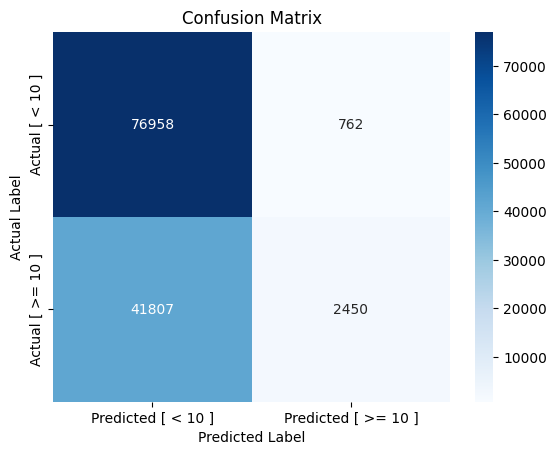

f1_score: 0.5365781654742876
accuracy: 0.6510079769136804

area under ROC: 0.6871815697197269


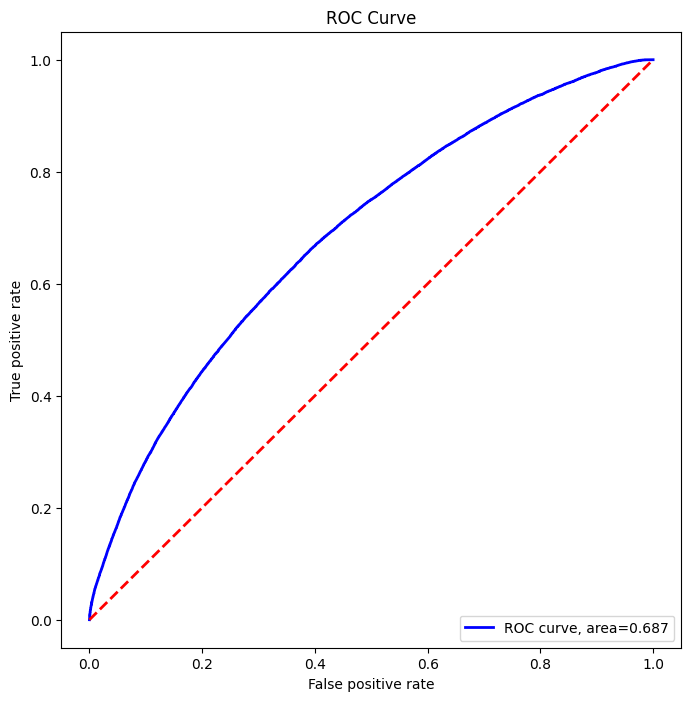

In [0]:

show_confusion_matrix(predictions)
calculate_metrics(predictions)
show_ROC_curve_and_calculate_area(predictions)


k-fold (Cross validation). Selection of parameters: regularization, type reregularization, max iterations

In [0]:
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator
import numpy as np

logistic_regresion = LogisticRegression()

param_grid_lr = (ParamGridBuilder()
             .addGrid(logistic_regresion.regParam, np.arange(0, 1.1, 0.2))
             .addGrid(logistic_regresion.elasticNetParam, np.arange(0, 1.1, 0.2))
             .addGrid(logistic_regresion.maxIter, range(10, 110, 10))
             .build()
            )

evaluator_lg = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="f1")
cross_validator = CrossValidator(estimator=logistic_regresion, estimatorParamMaps=param_grid_lr, evaluator=evaluator_lg, numFolds=3)

logistic_regresion_models = cross_validator.fit(training_dataset)

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Result of parameter selection

In [0]:
for params, metric in zip(logistic_regresion_models.getEstimatorParamMaps(), logistic_regresion_models.avgMetrics):
    print(f"regParam (Regular param): {params[logistic_regresion.regParam]}")
    print(f"elasticNetParam (Regular type): {params[logistic_regresion.elasticNetParam]}")
    print(f"maxIter (Maximum Iterations): {params[logistic_regresion.maxIter]}")
    print(f"F1 score: {metric}")
    print("-" * 50)

logistic_regresion_best_model = logistic_regresion_models.bestModel 
predictions = logistic_regresion_best_model.transform(test_dataset)
f1_score = evaluator_lg.evaluate(predictions)
print("\nBest Parameters:")
print(f"regParam: {logistic_regresion_best_model.getRegParam()}, elasticNetParam: {logistic_regresion_best_model.getElasticNetParam()}, maxIter: {logistic_regresion_best_model.getMaxIter()}")
print(f"F1 score: {f1_score}")

regParam (Regular param): 0.0
elasticNetParam (Regular type): 0.0
maxIter (Maximum Iterations): 10
F1 score: 0.7129840993625519
--------------------------------------------------
regParam (Regular param): 0.0
elasticNetParam (Regular type): 0.0
maxIter (Maximum Iterations): 20
F1 score: 0.7493006252160542
--------------------------------------------------
regParam (Regular param): 0.0
elasticNetParam (Regular type): 0.0
maxIter (Maximum Iterations): 30
F1 score: 0.7494894419311097
--------------------------------------------------
regParam (Regular param): 0.0
elasticNetParam (Regular type): 0.0
maxIter (Maximum Iterations): 40
F1 score: 0.7494709953467164
--------------------------------------------------
regParam (Regular param): 0.0
elasticNetParam (Regular type): 0.0
maxIter (Maximum Iterations): 50
F1 score: 0.7494811798393289
--------------------------------------------------
regParam (Regular param): 0.0
elasticNetParam (Regular type): 0.0
maxIter (Maximum Iterations): 60
F1 sco

/databricks/spark/python/pyspark/sql/context.py:164: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


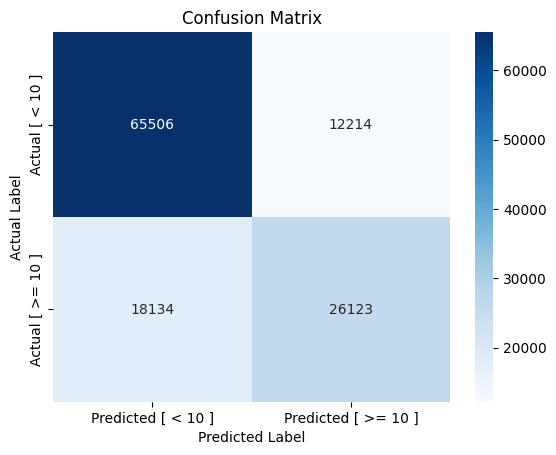

f1_score: 0.7468465018895087
accuracy: 0.7511989965321331

area under ROC: 0.8165157945652


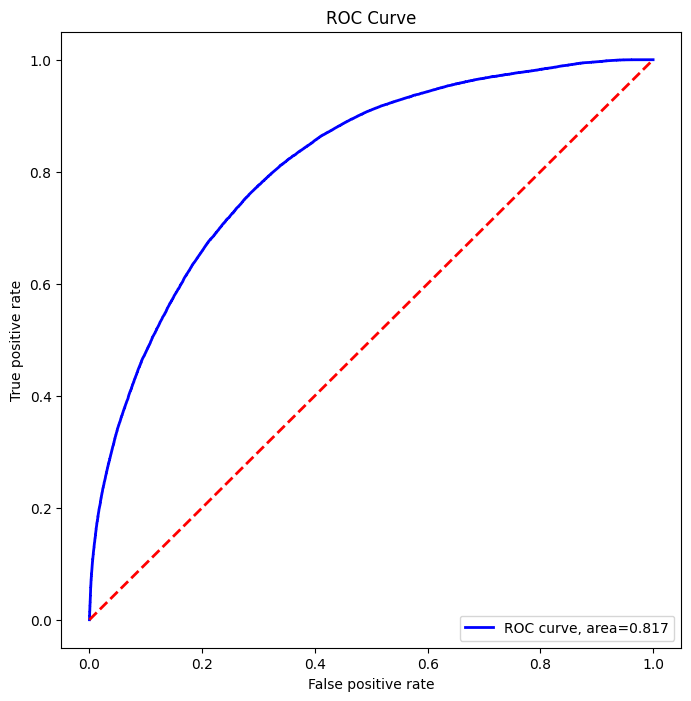

In [0]:
show_confusion_matrix(predictions)
calculate_metrics(predictions)
show_ROC_curve_and_calculate_area(predictions)

## Сlassification Random Forest
well suited for medium and large datasets
 

Create and training model


In [0]:
from pyspark.ml.classification import RandomForestClassifier

random_forest = RandomForestClassifier(labelCol="label", featuresCol="features")

random_forest_model = random_forest.fit(training_dataset)

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

result for created model

In [0]:
predictions_rf = random_forest_model.transform(test_dataset)
display(predictions_rf)

features,label,rawPrediction,probability,prediction
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 38, 138, 238), values -> List(7.949999809265137, 1.0, 1.0, 1.0, 1.0, 12.0))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(14.9138859484941, 5.086114051505901))","Map(vectorType -> dense, length -> 2, values -> List(0.7456942974247049, 0.25430570257529506))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 38, 140, 238), values -> List(2.0999999046325684, 1.0, 1.0, 1.0, 1.0, 15.0))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(14.372282322159132, 5.627717677840869))","Map(vectorType -> dense, length -> 2, values -> List(0.7186141161079566, 0.28138588389204344))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 38, 141, 238), values -> List(1.25, 1.0, 1.0, 1.0, 1.0, 17.0))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(12.175747946906903, 7.824252053093099))","Map(vectorType -> dense, length -> 2, values -> List(0.6087873973453451, 0.39121260265465496))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 38, 141, 238), values -> List(1.649999976158142, 1.0, 1.0, 1.0, 1.0, 11.0))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(12.175747946906903, 7.824252053093099))","Map(vectorType -> dense, length -> 2, values -> List(0.6087873973453451, 0.39121260265465496))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 38, 143, 238), values -> List(0.8500000238418579, 1.0, 1.0, 1.0, 1.0, 10.0))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(9.455097000173652, 10.544902999826348))","Map(vectorType -> dense, length -> 2, values -> List(0.47275485000868256, 0.5272451499913174))",1.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 38, 143, 238), values -> List(1.649999976158142, 1.0, 1.0, 1.0, 1.0, 15.0))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(12.175747946906903, 7.824252053093099))","Map(vectorType -> dense, length -> 2, values -> List(0.6087873973453451, 0.39121260265465496))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 38, 145, 238), values -> List(2.950000047683716, 1.0, 1.0, 1.0, 1.0, 15.0))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(14.526896868347748, 5.473103131652254))","Map(vectorType -> dense, length -> 2, values -> List(0.7263448434173874, 0.2736551565826127))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 38, 147, 238), values -> List(4.949999809265137, 1.0, 1.0, 1.0, 1.0, 12.0))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(14.526896868347748, 5.473103131652254))","Map(vectorType -> dense, length -> 2, values -> List(0.7263448434173874, 0.2736551565826127))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 38, 147, 238), values -> List(7.949999809265137, 1.0, 1.0, 1.0, 1.0, 14.0))",0.0,"Map(vectorType -> dense, length -> 2, values -> List(14.526896868347748, 5.473103131652254))","Map(vectorType -> dense, length -> 2, values -> List(0.7263448434173874, 0.2736551565826127))",0.0
"Map(vectorType -> sparse, length -> 239, indices -> List(0, 1, 37, 38, 148, 238), values -> List(1.649999976158142, 1.0, 1.0, 1.0, 1.0, 18.0))",1.0,"Map(vectorType -> dense, length -> 2, values -> List(12.175747946906903, 7.824252053093099))","Map(vectorType -> dense, length -> 2, values -> List(0.6087873973453451, 0.39121260265465496))",0.0


/databricks/spark/python/pyspark/sql/context.py:164: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


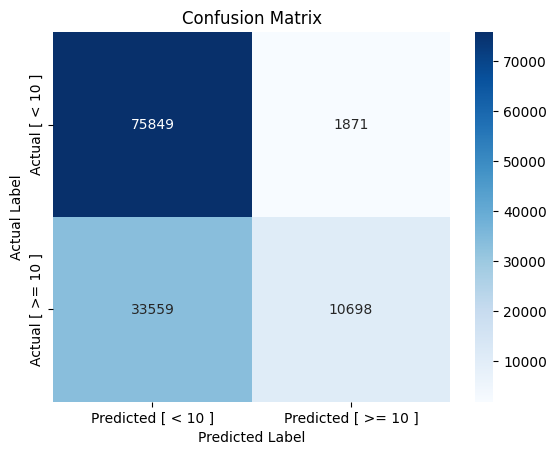

f1_score: 0.6531426563490632
accuracy: 0.7095354042155488

area under ROC: 0.8082044027311539


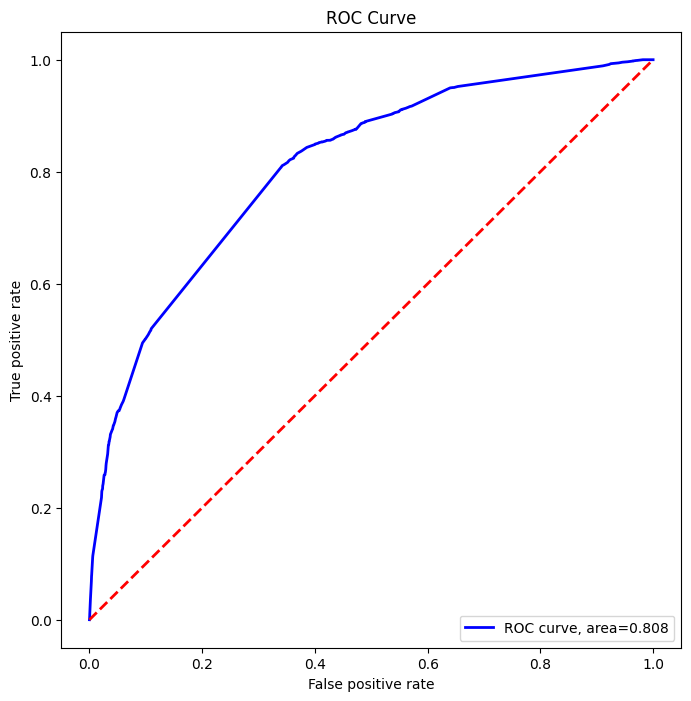

In [0]:
show_confusion_matrix(predictions_rf)
calculate_metrics(predictions_rf)
show_ROC_curve_and_calculate_area(predictions_rf)

k-fold (Cross validator)


In [0]:
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator

param_grid_rf = (ParamGridBuilder()
             .addGrid(random_forest.maxDepth, [2, 4, 6])
             .addGrid(random_forest.maxBins, [20, 40, 60])
             .addGrid(random_forest.numTrees, [5, 10, 20])
             .build()
            )

evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction")
cross_validator_rf = CrossValidator(estimator=random_forest, estimatorParamMaps=param_grid_rf, evaluator=evaluator, numFolds=5)

CV_random_forest_model = cross_validator_rf.fit(training_dataset)

CV_predictions_rf = CV_random_forest_model.transform(test_dataset)

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Result of parameter selection

/databricks/spark/python/pyspark/sql/context.py:164: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


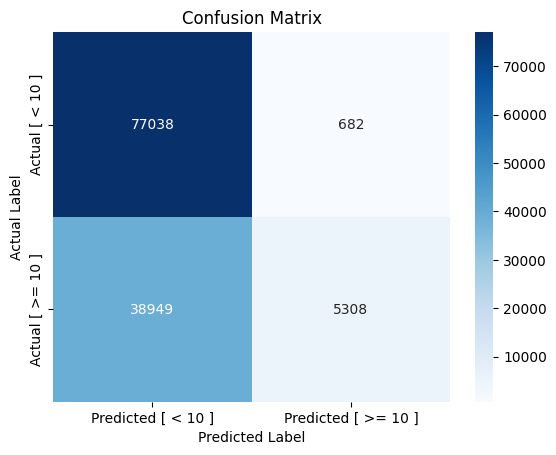

f1_score: 0.5834667654607022
accuracy: 0.6750944850258656

area under ROC: 0.7727528801123266


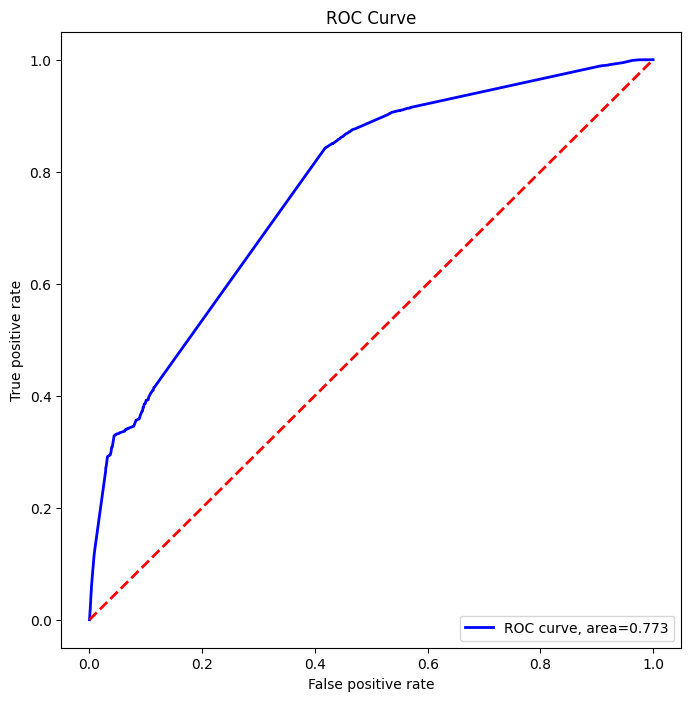

In [0]:
show_confusion_matrix(CV_predictions_rf)
calculate_metrics(CV_predictions_rf)
show_ROC_curve_and_calculate_area(CV_predictions_rf)

## Clustering K-means
well suited for large datasets


select count clusters


Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Count clusters: 2, training cost: 439268278.2611034, silhouette score: 0.9999958878672104
Count clusters: 3, training cost: 162141781.75006795, silhouette score: 0.9999439345848719
Count clusters: 4, training cost: 78681440.65412155, silhouette score: 0.9998927270865076
Count clusters: 5, training cost: 41524345.064473644, silhouette score: 0.9998700073525112
Count clusters: 6, training cost: 37934101.11089814, silhouette score: 0.8091888722185323
Count clusters: 7, training cost: 36953589.73589822, silhouette score: 0.8091869254444812
Count clusters: 8, training cost: 16816874.30221476, silhouette score: 0.9987236529986951
Count clusters: 9, training cost: 11794644.043983994, silhouette score: 0.7313494802758113
Count clusters: 10, training cost: 11048709.362376623, silhouette score: 0.7151349478423553
Count clusters: 11, training cost: 11055258.798586007, silhouette score: 0.7769791079068262
Count clusters: 12, training cost: 7986393.766618857, silhouette score: 0.7151075516065688
Co

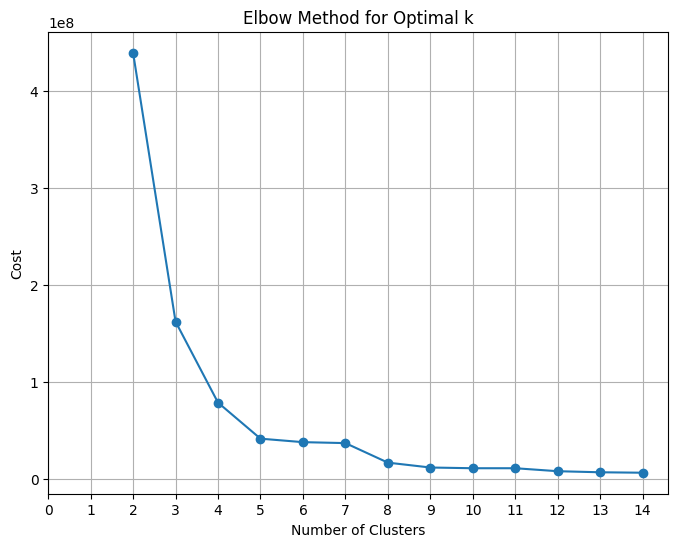

In [0]:
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator
import matplotlib.pyplot as plt

evaluator = ClusteringEvaluator()
training_costs = []
silhouette_scores = []
for k in range(2, 15):
    k_means = KMeans(featuresCol="features", k=k, seed=20)
    k_means_model = k_means.fit(dataset)
    training_costs.append(k_means_model.summary.trainingCost)
    silhouette_scores.append(evaluator.evaluate(k_means_model.transform(dataset)))

for i in range(2, 15):
    print(f"Count clusters: {i}, training cost: {training_costs[i-2]}, silhouette score: {silhouette_scores[i-2]}")

plt.figure(figsize=(8, 6))
plt.plot(range(2, 15), training_costs, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Cost')
plt.title('Elbow Method for Optimal k')
plt.xticks(range(0, 15))
plt.grid(True)
plt.show()

Selection of parameters: count clusters, count maxIteration, initialization method

In [0]:
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator

k_means = KMeans(seed=20)

param_grid = (ParamGridBuilder()
              .addGrid(k_means.k, range(3, 15))
              .addGrid(k_means.maxIter, range(50, 400, 50))
              .addGrid(k_means.initMode, ["random", "k-means||"])
              .build())

evaluator = ClusteringEvaluator(featuresCol="features", predictionCol="prediction", metricName="silhouette")

cross_validator = CrossValidator(estimator=k_means,
                                 estimatorParamMaps=param_grid,
                                 evaluator=evaluator,
                                 numFolds=3)

k_means_models = cross_validator.fit(dataset)

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Result of parameter selection

In [0]:
for params, metric in zip(k_means_models.getEstimatorParamMaps(), k_means_models.avgMetrics):
    print(f"k (Number of Clusters): {params[k_means.k]}")
    print(f"maxIter (Maximum Iterations): {params[k_means.maxIter]}")
    print(f"initMode (Initialization Method): {params[k_means.initMode]}")
    print(f"Silhouette Score (Average Metric): {metric}")
    print("-" * 50)

k_means_best_model = k_means_models.bestModel 
predictions = k_means_best_model.transform(dataset)
silhouette_score = evaluator.evaluate(predictions)
print("\nBest Parameters:")
print(f"k: {k_means_best_model.getK()}, max_iter: {k_means_best_model.getMaxIter()}, init_mode: {k_means_best_model.getInitMode()}")
print(f"Silhouette Score: {silhouette_score}")

k (Number of Clusters): 3
maxIter (Maximum Iterations): 50
initMode (Initialization Method): random
Silhouette Score (Average Metric): 0.9414754581742044
--------------------------------------------------
k (Number of Clusters): 3
maxIter (Maximum Iterations): 50
initMode (Initialization Method): k-means||
Silhouette Score (Average Metric): 0.9998886039202639
--------------------------------------------------
k (Number of Clusters): 3
maxIter (Maximum Iterations): 100
initMode (Initialization Method): random
Silhouette Score (Average Metric): 0.9414754581742045
--------------------------------------------------
k (Number of Clusters): 3
maxIter (Maximum Iterations): 100
initMode (Initialization Method): k-means||
Silhouette Score (Average Metric): 0.9998886039202639
--------------------------------------------------
k (Number of Clusters): 3
maxIter (Maximum Iterations): 150
initMode (Initialization Method): random
Silhouette Score (Average Metric): 0.9414754581742045
-----------------

Show clustering result


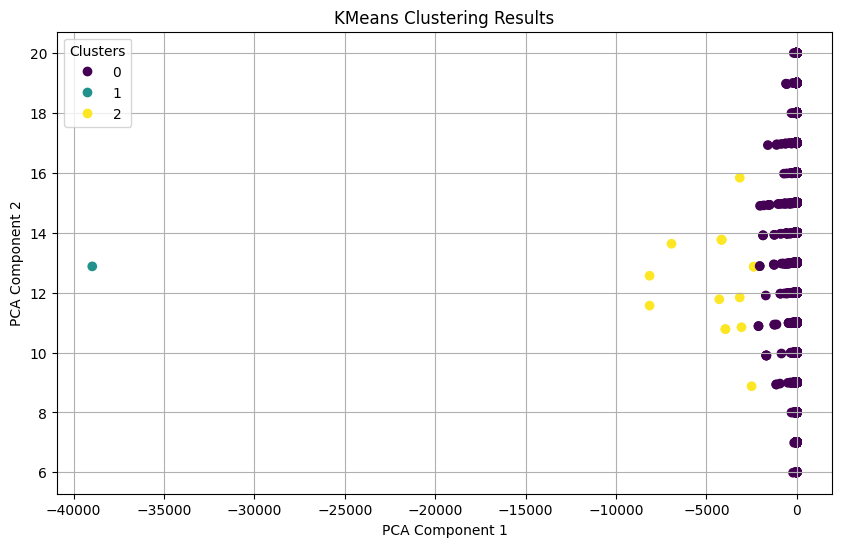

In [0]:
from pyspark.ml.feature import PCA
from pyspark.ml.evaluation import ClusteringEvaluator

pca = PCA(k=2, inputCol="features", outputCol="pcaFeatures")
pca_model = pca.fit(dataset)
pca_cluster_dataset = pca_model.transform(dataset)

predictions = k_means_best_model.transform(pca_cluster_dataset)
show_clustering_result(predictions, "KMeans Clustering Results")

## Clustering Bisecting K-Means
well suited for large datasets


Select count clusters

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Count clusters: 2, training cost: 439268278.2610848, silhouette score: 0.9999958878672104
Count clusters: 3, training cost: 156969569.69823778, silhouette score: 0.9999013061139174
Count clusters: 4, training cost: 152878270.76570642, silhouette score: 0.8212593383756626
Count clusters: 5, training cost: 83894901.14897676, silhouette score: 0.8212933215814866
Count clusters: 6, training cost: 82659918.98395592, silhouette score: 0.34742562044214875
Count clusters: 7, training cost: 48359180.68206242, silhouette score: 0.37392338386227236
Count clusters: 8, training cost: 44173177.92127851, silhouette score: 0.37390536060284024
Count clusters: 9, training cost: 17864001.53783995, silhouette score: 0.373930146742574
Count clusters: 10, training cost: 17551599.428285614, silhouette score: 0.17621795822740693
Count clusters: 11, training cost: 17371517.611366604, silhouette score: 0.15999432924985094
Count clusters: 12, training cost: 12148422.007259216, silhouette score: 0.221665783172785

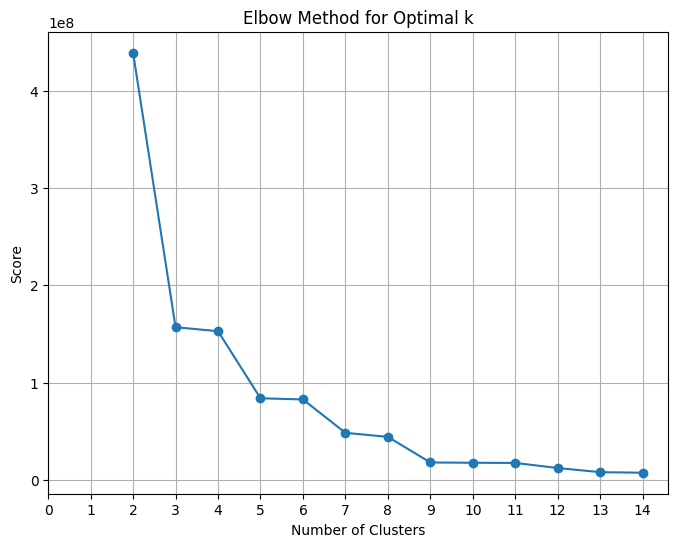

In [0]:
from pyspark.ml.clustering import BisectingKMeans
from pyspark.ml.evaluation import ClusteringEvaluator
import matplotlib.pyplot as plt

evaluator = ClusteringEvaluator()
training_costs = []
silhouette_scores = []
for k in range(2, 15):
    bisecting_kmeans = BisectingKMeans(featuresCol="features", k=k, seed=20)
    bisecting_kmeans_model = bisecting_kmeans.fit(dataset)
    training_costs.append(bisecting_kmeans_model.summary.trainingCost)
    silhouette_scores.append(evaluator.evaluate(bisecting_kmeans_model.transform(dataset)))

for i in range(2, 15):
    print(f"Count clusters: {i}, training cost: {training_costs[i-2]}, silhouette score: {silhouette_scores[i-2]}")

plt.figure(figsize=(8, 6))
plt.plot(range(2, 15), training_costs, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Method for Optimal k')
plt.xticks(range(0, 15))
plt.grid(True)
plt.show()

Selection of parameters: count clusters, count max iteration, minimal divisible cluster size

In [0]:
from pyspark.ml.clustering import BisectingKMeans
from pyspark.ml.evaluation import ClusteringEvaluator
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator

bisecting_kmeans = BisectingKMeans(seed=20)

param_grid_bkm = (ParamGridBuilder()
                    .addGrid(bisecting_kmeans.k, range(3, 11, 1))
                    .addGrid(bisecting_kmeans.maxIter, range(10, 30, 10))
                    .addGrid(bisecting_kmeans.minDivisibleClusterSize, [0.1, 0.2, 0.3])
                    .build())

evaluator_bkm = ClusteringEvaluator(featuresCol="features", predictionCol="prediction", metricName="silhouette")

cross_validator_bkm = CrossValidator(estimator=bisecting_kmeans,
                                     estimatorParamMaps=param_grid_bkm,
                                     evaluator=evaluator_bkm,
                                     numFolds=3)

bisecting_kmeans_models = cross_validator_bkm.fit(dataset)

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

Result of parameter selection


In [0]:
for params, metric in zip(bisecting_kmeans_models.getEstimatorParamMaps(), bisecting_kmeans_models.avgMetrics):
    print(f"k (Number of Clusters): {params[bisecting_kmeans.k]}")
    print(f"maxIter: {params[bisecting_kmeans.maxIter]}")
    print(f"minDivisibleClusterSize: {params[bisecting_kmeans.minDivisibleClusterSize]}")
    print(f"Silhouette Score: {metric}")
    print("-" * 50)

bisecting_kmeans_best_model = bisecting_kmeans_models.bestModel 
predictions = bisecting_kmeans_best_model.transform(dataset)
silhouette_score = evaluator_bkm.evaluate(predictions)
print("\nBest Parameters:")
print(f"k: {bisecting_kmeans_best_model.getK()}, max_iter: {bisecting_kmeans_best_model.getMaxIter()}, iminDivisibleClusterSize: {bisecting_kmeans_best_model.getMinDivisibleClusterSize()}")
print(f"Silhouette Score: {silhouette_score}")

k (Number of Clusters): 3
maxIter: 10
minDivisibleClusterSize: 0.1
Silhouette Score: 0.9371641056891672
--------------------------------------------------
k (Number of Clusters): 3
maxIter: 10
minDivisibleClusterSize: 0.2
Silhouette Score: 0.937164105689167
--------------------------------------------------
k (Number of Clusters): 3
maxIter: 10
minDivisibleClusterSize: 0.3
Silhouette Score: 0.9371641056891672
--------------------------------------------------
k (Number of Clusters): 3
maxIter: 20
minDivisibleClusterSize: 0.1
Silhouette Score: 0.9414754581742045
--------------------------------------------------
k (Number of Clusters): 3
maxIter: 20
minDivisibleClusterSize: 0.2
Silhouette Score: 0.9414754581742043
--------------------------------------------------
k (Number of Clusters): 3
maxIter: 20
minDivisibleClusterSize: 0.3
Silhouette Score: 0.9414754581742044
--------------------------------------------------
k (Number of Clusters): 4
maxIter: 10
minDivisibleClusterSize: 0.1
Silh

Show clustering result


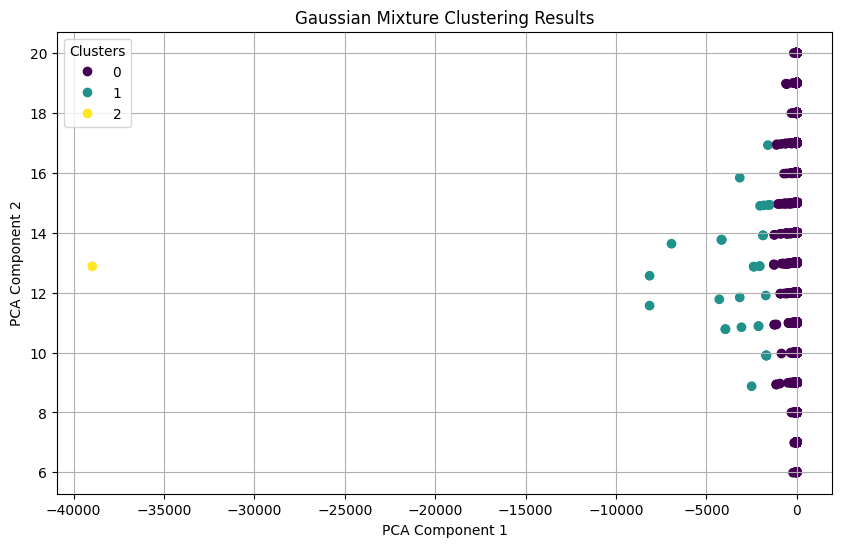

In [0]:
from pyspark.ml.feature import PCA
from pyspark.ml.evaluation import ClusteringEvaluator

pca = PCA(k=2, inputCol="features", outputCol="pcaFeatures")
pca_model = pca.fit(dataset)
pca_cluster_dataset = pca_model.transform(dataset)

predictions = bisecting_kmeans_best_model.transform(pca_cluster_dataset)
show_clustering_result(predictions, "Gaussian Mixture Clustering Results")